In [3]:
import ipywidgets as widgets
from ipywidgets import interact, IntSlider, FloatSlider
from IPython.display import HTML

import numpy as np
%matplotlib inline 
import matplotlib.pyplot as plt
from bokeh.plotting import figure,show
from bokeh.io import output_notebook
output_notebook()

from numpy import pi, cos, sin, exp

%load_ext autoreload

%autoreload 2

from soundwave_plots import traveling_soundwave_animation, sound_reflection_animation, sound_standingwave_animation
from soundwave_Fourier import soundwave_interactive, pressure_plot

Loading BokehJS ...

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


**For students in physics 223 spring 2021 only. No permission granted for distribution or copying**

**This is a first version. It is a work in progress. Alert me to any errors.**

## Sound Reflections
The animation below shows a sound pulse traveling from left to right, encountering a hard bounardy on the right, reflecting and then travleing to the left. We have learned that when a wave reflects off a hard boundary, the wave is inverted. Sound waves make this notion intuitive. When the particles hit the boundary at the right, they bounce back (what else would they do?). Therefore the displacement must be inverted  (be sure you understand this). The reflection of the displacement is animated in the bottom panel of the animation. 

In [2]:
anim=sound_reflection_animation()
HTML(anim.to_jshtml())

## Standing Waves

Just like in the case for strings, we can excite a sound standing wave. Below are several animations of standing waves in a pipe. The first is a pipe closed at both ends, 2nd harmonic. You should observe the boundary conditions. At the left and right ends the displacement is zero. This, of course, is sensible boundary condition, as the particles cannot penetrate the closed end of the pipe and therefore the displacement must be zero (unless you where a [quantum particle](https://www.youtube.com/watch?v=cTodS8hkSDg), oh where did the modern physics course go - complain to the administration!). The second animation is for a pipe with an open left end and a closed right end at 5th harmonic. Here we see that the pressure changes are zero at the open end. This also makes sense, as the pressure should match the surrounding pressure (usually atmospheric) at the open end. The third animation shows a pipe with both ends open at the sixth harmonic. You are free to change the harmonic by chaning the value of n in each block of code. It does take some time to produce the animation, so be patient. 

In [5]:
# closed - closed
# you can change the value n here
n=2
anim=sound_standingwave_animation(n,"CC")
HTML(anim.to_jshtml())

In [5]:
# open - closed
# you can change the value n here
n=5
anim=sound_standingwave_animation(n,"OC")
HTML(anim.to_jshtml())

In [4]:
# open - open
# you can change the value n here
n=6
anim=sound_standingwave_animation(n,"OO")
HTML(anim.to_jshtml())

## Fourier series in the time domain
If we have a function periodic in time, with period $T$, we can easily apply our Fourier method by making a quick relabeling of the variables. In the spatial domain, we considered a function periodic on the interval $0 \leq x \leq L$. We introduced the wave number $k_n= 2 \pi n/L$. The formulas for the Fourier series in the time domain involve relabeling $x \longleftrightarrow t$, $L \longleftrightarrow T$, and $k_n \longleftrightarrow \omega_n$, where $\omega_n = 2 \pi n /T$. Mathematically, there is no difference what we call our variables. However, physcially, we should be clear that we are now considering a function of time $f(t)$ not of position. The relevant quantities are the period $T$ and the frequencies $\omega_n$. Our program for Fourier series is now (it is only a relabeling-nothing new)
\begin{align} 
f(t) = a_0  + \displaystyle \sum_{n=1}^\infty a_n \cos(\omega_n t) + b_n \sin(\omega_n t) ~, 
\end{align} 

\begin{align} 
a_0 = \frac{1}{T} \int_0^T f(t) dt ~, 
\end{align} 

\begin{align} 
a_n = \frac{2}{T} \int_0^T f(t) \cos(\omega_n t)  dt ~,
\end{align} 

\begin{align} 
b_n = \frac{2}{T} \int_0^T f(t) \sin(\omega_n t)  dt ~, 
\end{align}

\begin{align} 
w_n = \frac{2 \pi n}{T} ~. 
\end{align}

## Fourier series applied to sound
*Example taken from Boas, 1966, my copy of the book is courtesy of my father, it was orginally his.*
We consider a sound wave generated by pressure variations given by 
\begin{align} 
P(t) = \begin{cases} 1 & \quad \text{for } 0 \leq t < \frac{T}{4} \\
-\frac{7}{8}& \quad \text{for } \frac{T}{4} \leq t < \frac{T}{2} \\
\frac{7}{8} & \quad \text{for } \frac{T}{2} \leq t < \frac{3T}{4} \\
-1 & \quad \text{for } \frac{3T}{4}\leq t < T ~,  
\end{cases} 
\end{align}
with a period of $T=1/262 \;s$. Although no units have been given for the pressure $P(t)$, a good assumption is that $P(t)=1$ corresponds to a pressure of $10^{-6}$ atmospheres. The function is plotted below for several periodic oscillations. We would like to expand this function in Fourier series. 

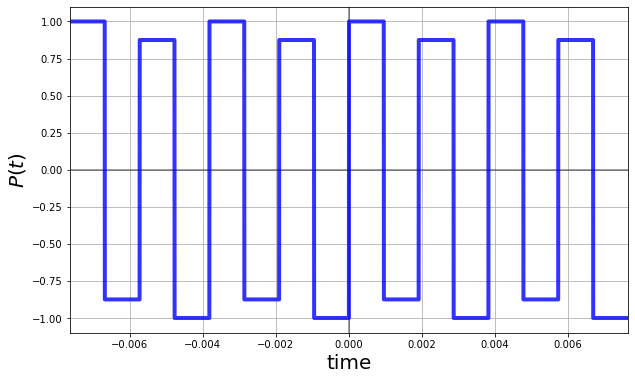

In [7]:
pressure_plot()

This function is odd, so we only need to compute the $b_n$. The function $P(t)$ is peicewise and therfore the $b_n$ integral needs to be broken into four parts on the interval $-T/2 \leq t \leq T/2$ (it turns out that the integrals are a bit easier on this interval instead of $0 \leq t \leq T$. 

\begin{align} 
b_n = \frac{2}{T} \int_{-T/2}^{-T/4} P(t) \sin\left(\frac{2 n \pi}{T} t\right)  dt  + \frac{2}{T} \int_{-T/4}^{0} P(t) \sin\left(\frac{2 n \pi}{T} t\right) dt + \frac{2}{T} \int_{0}^{T/4} P(t) \sin\left(\frac{2 n \pi}{T} t\right)  dt + \frac{2}{T} \int_{T/4}^{T/2} P(t) \sin\left(\frac{2 n \pi}{T} t\right) dt ~.
\end{align} 

*Look I made a long line - happened by accident, I will keep it, looks cool.*

-----------------
Lets work each of the integrals over sine in turn, starting at the left most integral
\begin{align} 
\frac{7}{8}\frac{2}{T} \int_{-T/2}^{-T/4}  \sin\left(\frac{2 n \pi}{T} t\right)  dt =-\frac{7}{8} \frac{1}{ n \pi} \left( \cos\left(\frac{n \pi}{2}\right)  - \cos(n\pi)\right) ~, 
\end{align} 

\begin{align} 
-\frac{2}{T} \int_{-T/4}^{0}  \sin\left(\frac{2 n \pi}{T} t\right)  dt =\frac{1}{ n \pi} \left( \cos(0)  - \cos\left(\frac{n \pi}{2}\right)\right)~, 
\end{align} 

\begin{align} 
 \frac{2}{T} \int_{0}^{T/4}  \sin\left(\frac{2 n \pi}{T} t\right)  dt = -\frac{1}{n \pi} \left(  \cos\left(\frac{n \pi}{2}\right) - \cos(0)\right) ~, 
\end{align} 

\begin{align} 
-\frac{7}{8} \frac{2}{T} \int_{T/4}^{T/2}  \sin\left(\frac{2 n \pi}{T} t\right)  dt = \frac{7}{8}\frac{1}{n \pi} \left(  \cos(n \pi)- \cos\left(\frac{n \pi}{2}\right) \right)  ~, 
\end{align} 

Adding the results up, we get the following
\begin{align} 
\begin{split} 
b_n & =\frac{2}{n \pi} \left( \frac{7}{8} \cos(n \pi)- \frac{7}{8}\cos\left(\frac{n \pi}{2}\right) + 1 -\cos\left(\frac{n \pi}{2}\right) \right)   \\
& =\frac{2}{n \pi} \left( \frac{7}{8} \cos(n \pi)- \frac{15}{8}\cos\left(\frac{n \pi}{2}\right) + 1 \right)   ~.
\end{split} 
\end{align} 

Below is an interactive widget that adds the Fouier terms. Have some fun. 

In [9]:
soundwave_interactive();

interactive(children=(IntSlider(value=1, description='n terms', min=1), Output()), _dom_classes=('widget-inter…